In [4]:
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.applications.vgg16 import preprocess_input
from keras.applications.vgg16 import decode_predictions
from keras.applications.vgg16 import VGG16
from PIL import Image
from IPython.display import display

import matplotlib.pyplot as plt
import glob
import numpy as np
import os
import re
import pandas as pd
import seaborn as sns

In [10]:
# All images
root_dir = 'C:\\Users\\Me\\Downloads\\sonkkilat_20200417\\photos\\'

# Selected images
folder_path = 'C:\\Users\\Me\\Pictures\\Instaselection'

model = VGG16()

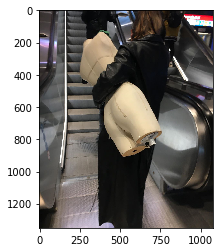

golfcart (22.74%)


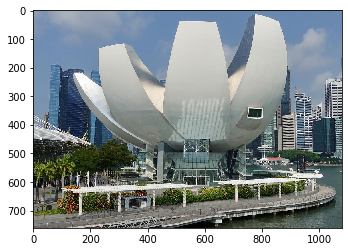

liner (30.28%)


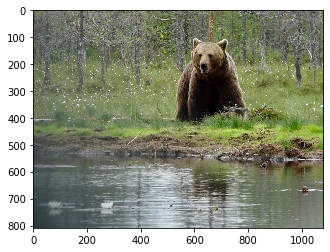

brown_bear (99.16%)


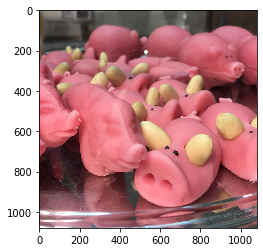

piggy_bank (51.02%)


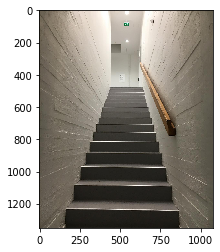

bannister (93.09%)


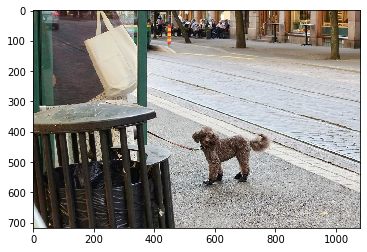

ashcan (30.91%)


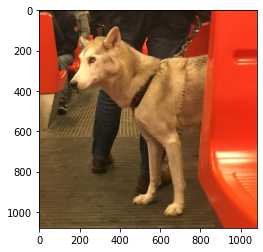

dingo (18.16%)


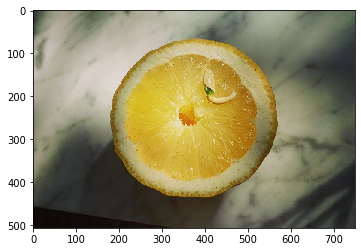

orange (60.03%)


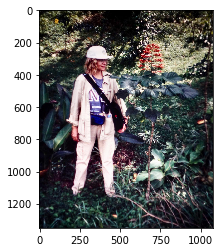

chain_saw (7.81%)


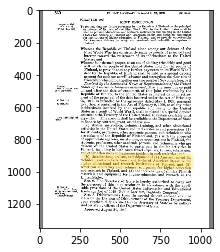

menu (40.22%)


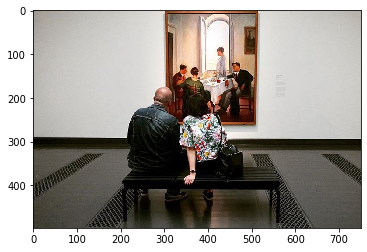

grand_piano (23.82%)


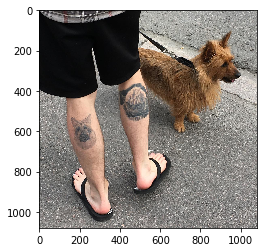

Australian_terrier (50.06%)


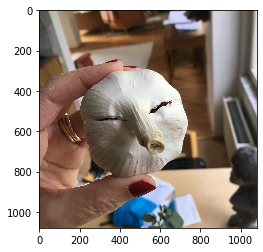

mask (17.82%)


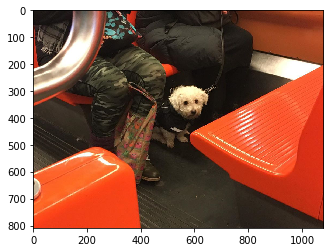

black-footed_ferret (11.97%)


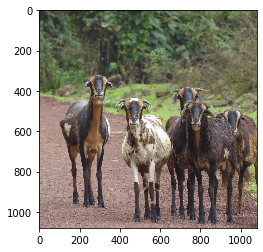

Arabian_camel (74.62%)


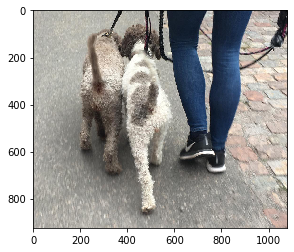

Bedlington_terrier (25.65%)


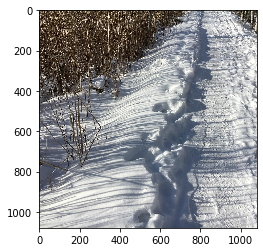

American_alligator (32.55%)


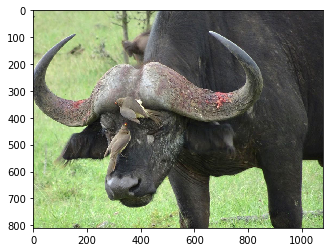

water_buffalo (87.95%)


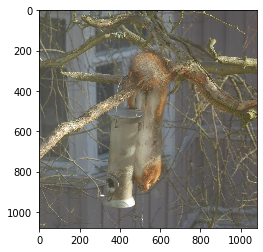

squirrel_monkey (22.57%)


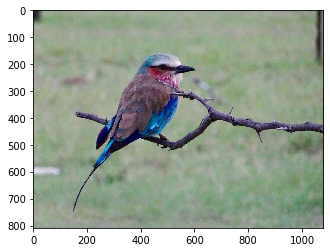

bee_eater (79.76%)


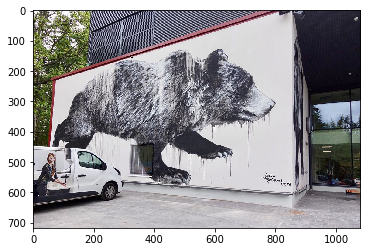

moving_van (27.47%)


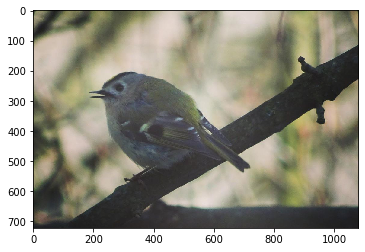

indigo_bunting (85.06%)


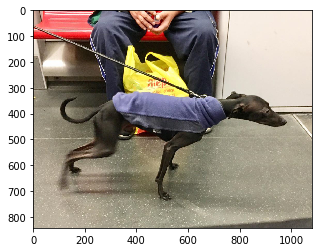

Staffordshire_bullterrier (28.14%)


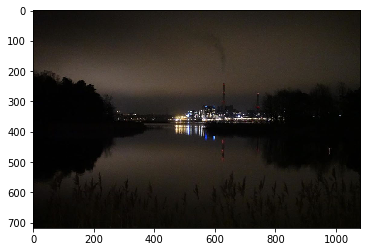

lakeside (31.73%)


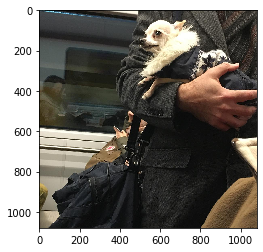

fur_coat (16.13%)


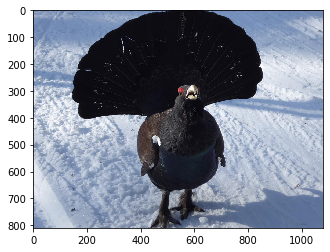

black_grouse (96.69%)


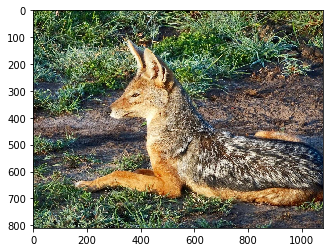

hare (37.17%)


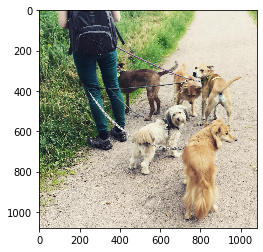

Irish_terrier (14.22%)


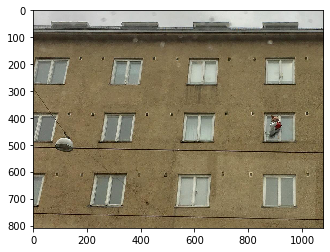

prison (34.05%)


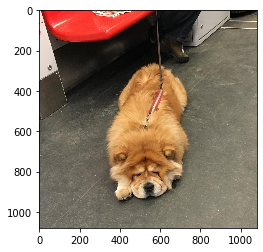

chow (98.83%)


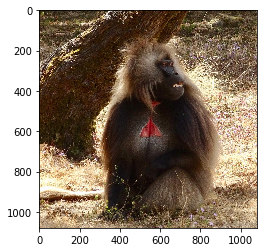

baboon (99.80%)


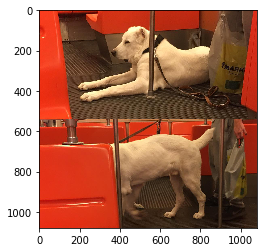

Saluki (47.88%)


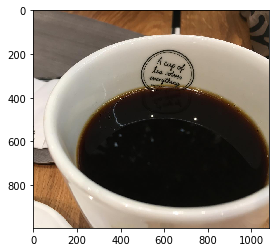

espresso (53.59%)


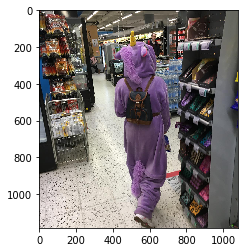

shoe_shop (84.31%)


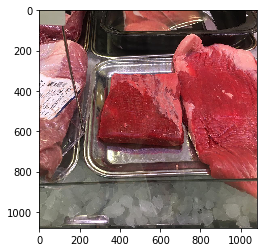

butcher_shop (78.01%)


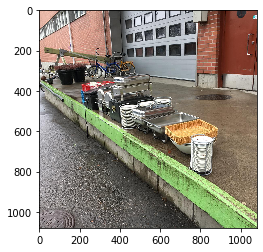

container_ship (9.66%)


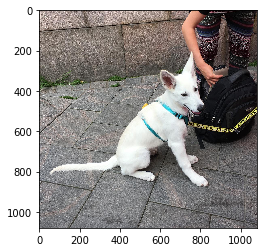

toy_terrier (38.10%)


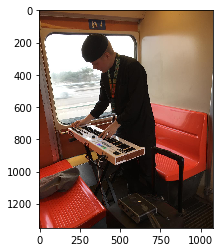

marimba (27.76%)


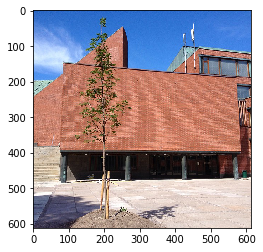

monastery (24.13%)


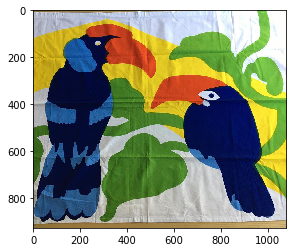

parachute (69.60%)


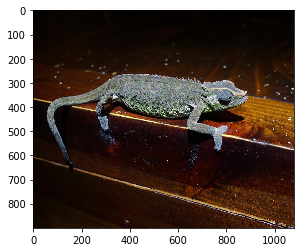

African_chameleon (60.76%)


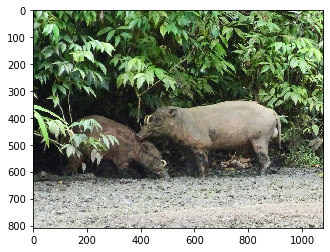

bighorn (28.82%)


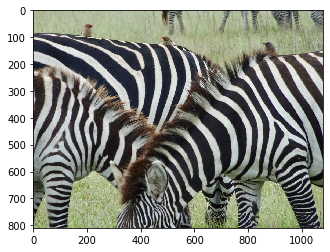

zebra (100.00%)


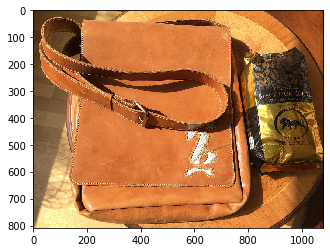

mailbag (53.22%)


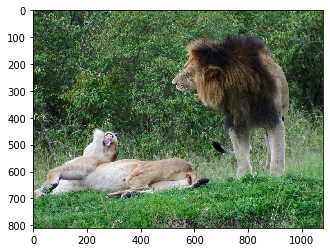

lion (99.02%)


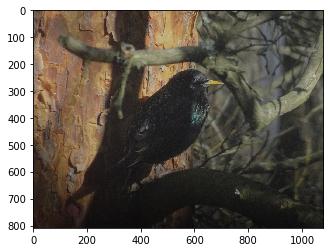

bald_eagle (14.20%)


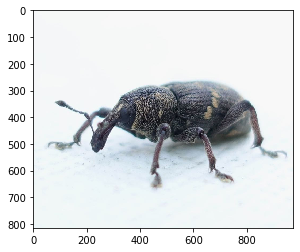

weevil (99.99%)


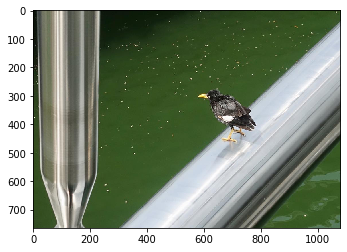

water_ouzel (57.18%)


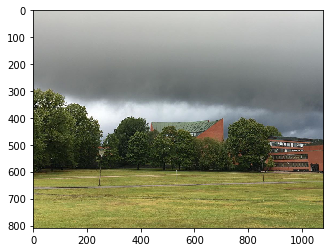

barn (85.62%)


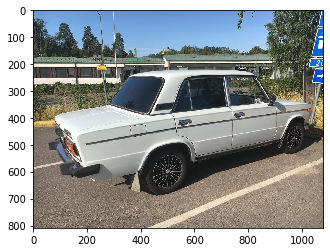

police_van (32.63%)


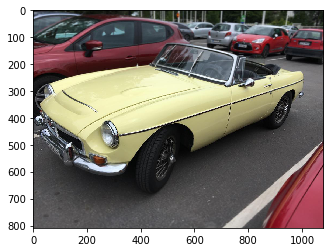

convertible (80.38%)


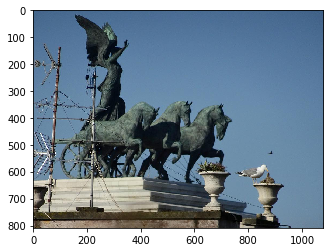

fountain (67.20%)


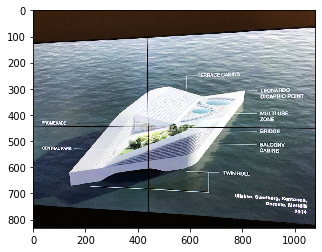

envelope (50.12%)


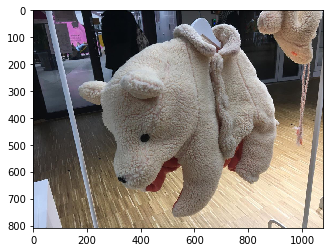

Bedlington_terrier (62.69%)


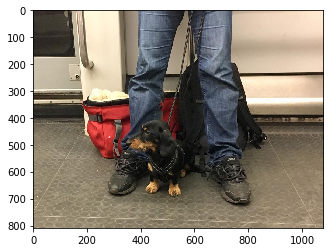

Gordon_setter (24.51%)


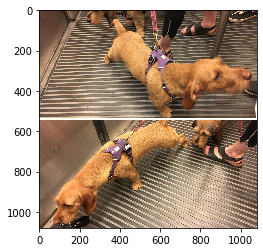

Irish_terrier (87.73%)


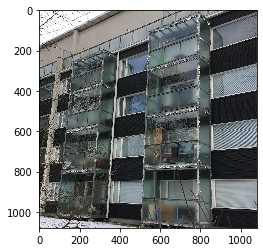

prison (14.40%)


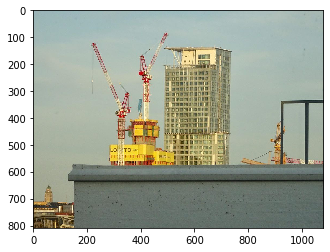

drilling_platform (52.87%)


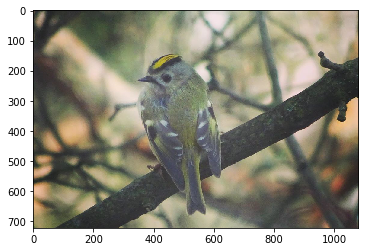

jacamar (29.92%)


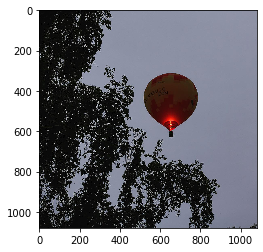

balloon (100.00%)


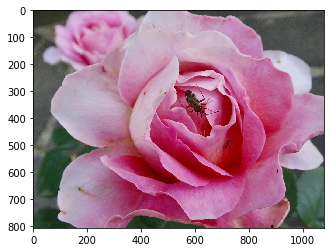

bee (73.80%)


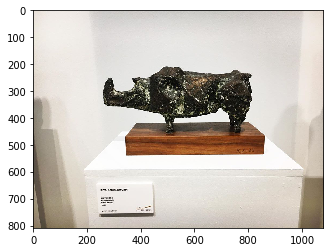

paper_towel (13.16%)


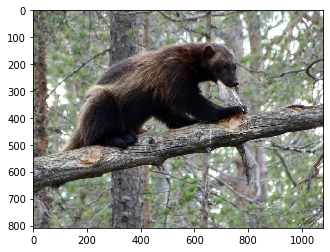

brown_bear (76.75%)


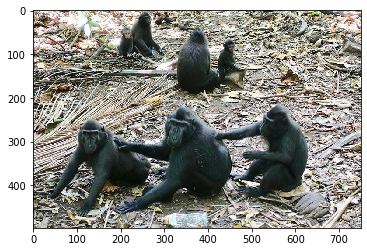

spider_monkey (67.14%)


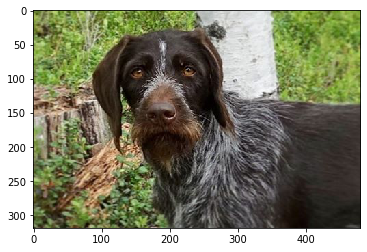

German_short-haired_pointer (89.10%)


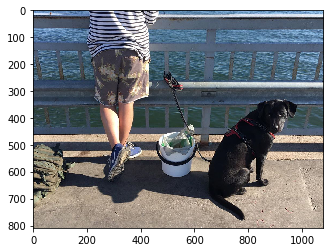

Rottweiler (16.76%)


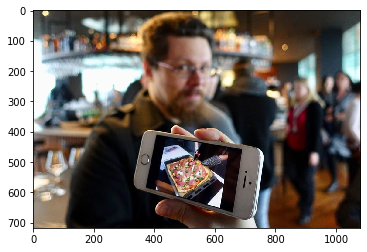

shoe_shop (26.19%)


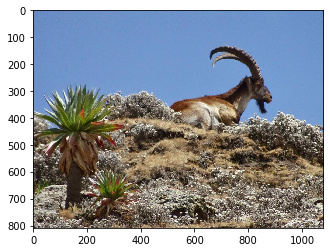

ibex (99.88%)


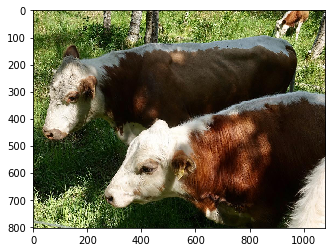

wire-haired_fox_terrier (26.29%)


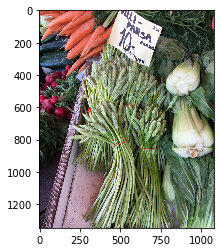

cucumber (26.38%)


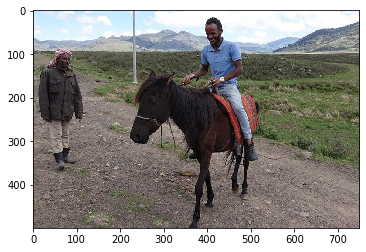

llama (18.51%)


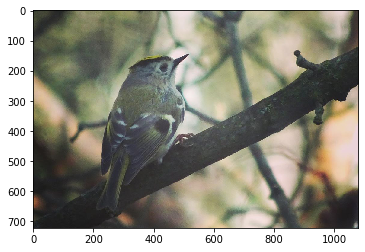

hummingbird (20.61%)


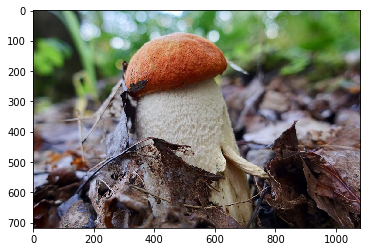

stinkhorn (98.59%)


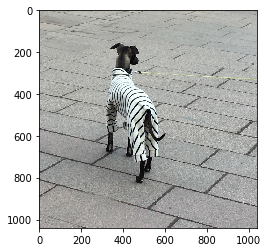

zebra (82.27%)


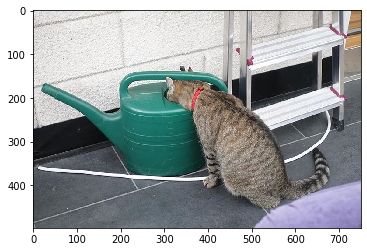

swab (15.07%)


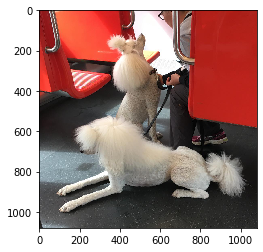

standard_poodle (48.58%)


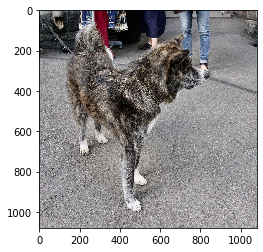

Irish_wolfhound (57.25%)


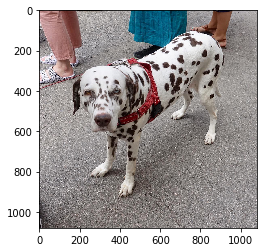

dalmatian (99.89%)


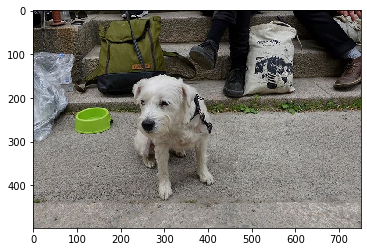

Irish_wolfhound (85.54%)


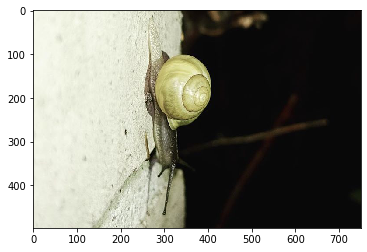

snail (39.98%)


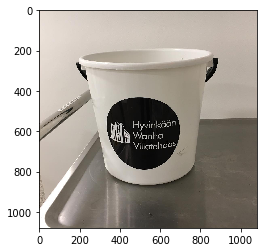

bucket (79.99%)


In [9]:
# Show selected and their classification
for img in os.listdir(folder_path):
    img = os.path.join(folder_path, img)
    %matplotlib inline
    pil_im = Image.open(img, 'r')
    plt.imshow(np.asarray(pil_im))
    # Without plt.show() only the last image is shown https://stackoverflow.com/a/39953765
    plt.show()
    img = load_img(img, target_size=(224, 224))
    img = img_to_array(img)
    img = img.reshape((1, img.shape[0], img.shape[1], img.shape[2]))
    img = preprocess_input(img)
    # predict the probability across all output classes
    yhat = model.predict(img)
    # convert the probabilities to class labels
    label = decode_predictions(yhat)
    # retrieve the most likely result, e.g. highest probability
    label = label[0][0]
    # print the classification
    print('%s (%.2f%%)' % (label[1], label[2]*100))
    

In [12]:
res = []

for img in glob.iglob(root_dir + '**/*.jpg', recursive=True):
    img = load_img(img, target_size=(224, 224))
    img = img_to_array(img)
    img = img.reshape((1, img.shape[0], img.shape[1], img.shape[2]))
    img = preprocess_input(img)
    yhat = model.predict(img)
    label = decode_predictions(yhat)
    label = label[0][0]
    res.append(label[1])

In [13]:
len(res)

2251

In [42]:
df = pd.DataFrame(res, columns=['label'])

sorted = df.groupby('label').size().sort_values(ascending = False)

fifteen_or_more = sorted[sorted >= 15]

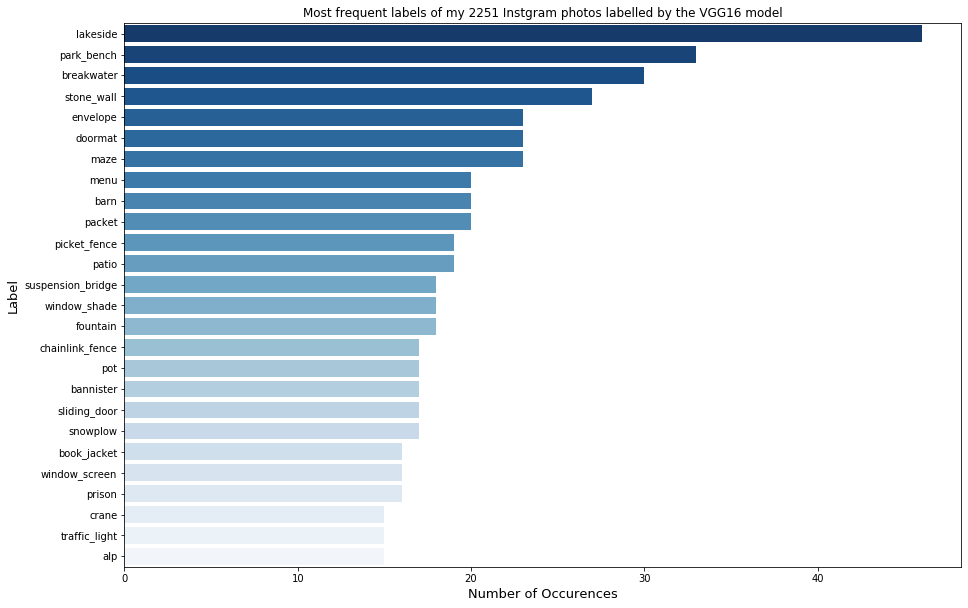

In [86]:
plt.figure(figsize=(15,10))
sns.barplot(y = fifteen_or_more.index, x = fifteen_or_more.values, palette = 'Blues_r')

plt.title('Most frequent labels of my ' + str(len(res)) + ' Instagram photos labelled by the VGG16 model')
plt.xlabel('Number of Occurences', fontsize=13)
plt.ylabel('Label', fontsize=13)

plt.show()